# import packages

In [36]:
# import tensorflow as tf
# import tensorflow.keras.preprocessing.image as image

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as tt
import torchvision.models as models
from torchvision.datasets import ImageFolder
from torch.utils.data import Dataset, DataLoader
from torchvision.utils import make_grid
from torch.utils.data import random_split, DataLoader
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import confusion_matrix

import os
import random
import cv2
import copy
import math
import time

import pandas as pd
import numpy as np
from matplotlib.image import imread
import seaborn as sns
from PIL import Image
from IPython.display import Image, display
import matplotlib.pyplot as plt

from sklearn.model_selection import StratifiedShuffleSplit

print(f'torch version: {torch.__version__}')
# print(f'tensorflow version: {tf.__version__}')
device = torch.device('cuda:0' if torch.cuda.is_available() else "cpu")
print(f'device:{device}')
print(f"cuda available: {torch.cuda.is_available()}")

torch version: 1.10.2
device:cuda:0
cuda available: True


In [37]:
%matplotlib inline

# plot chest xray and bounding box

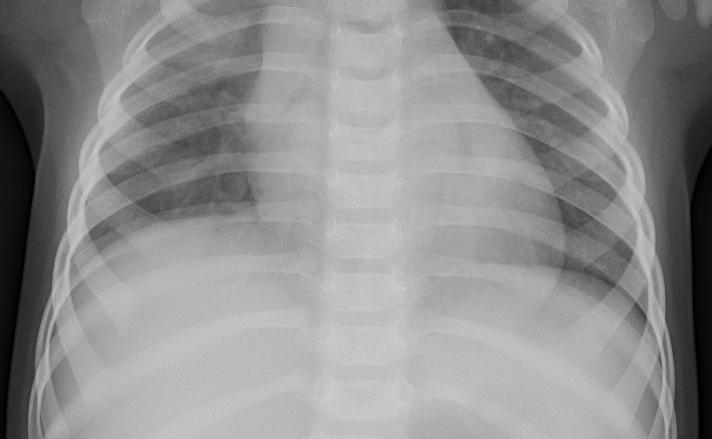

In [38]:
# display a sample image
image_sample_name = '/home/zhou/Documents/github/XAI/LEG/Image/person1_bacteria_1.jpeg'
display(Image(filename=image_sample_name))

In [39]:
print(os.getcwd())# '/home/zhou/Documents/github/XAI'
DATA_ROOT = '/home/zhou/Documents/github/XAI/datasets/chest_xray/'

/home/zhou/Documents/github/XAI



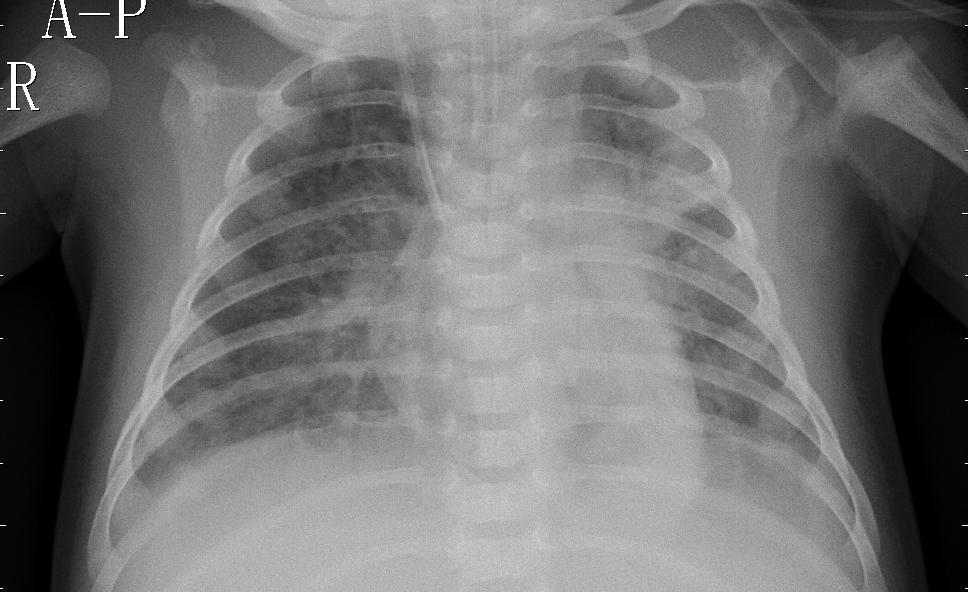

image shape:(592, 968)


In [40]:
def plot_box(file_path):
    """plot chest xray images with bounding box"""
    # read an chest x-ray image and show it
    tc_pneumonia_img = torchvision.io.read_image(file_path)
    tc_pneumonia_img.shape
    # rescale the img to [0, 1.0]
    import plotly.graph_objects as go
    import plotly.express as px
    from skimage import io

    fig = go.Figure()
    fig.add_annotation(x=50, y=100, text="Pneumonia")
    fig.update_layout(showlegend=False)
    pneumonia_img_arr = cv2.imread(file_path)
    fig = px.imshow(pneumonia_img_arr)
    fig.show()
    # plt.imshow(tc_pneumonia_img.permute(1, 2, 0)/255, cmap="gray")

    img_arr = io.imread(file_path)
    print(f'image shape:{img_arr.shape}')
    fig = px.imshow(img_arr, color_continuous_scale='gray')
    # make space for explanation / annotation
    # fig.update_layout(margin=dict(l=1, r=1, t=1, b=1))

    annotation_dict = dict(font=(dict(color='red',size=20)),x=470, y=10, showarrow=False, text="Pneumonia")
    fig.add_annotation(annotation_dict)
    fig.update_layout(
        dragmode='drawrect',
        newshape_line_color='cyan')
    fig.add_trace(go.Scatter(x=[200,400], y=[10, 110], text=['AoI'], mode='text'))
    fig.add_shape(type='rect', xref='x', yref='y', x0=200, y0=10, x1=400, y1=110,
                  line=dict(color='red')
                  )
    fig.show()

pneumonia_sample_img = "/home/zhou/Documents/github/XAI/datasets/chest_xray/chest_xray/val/PNEUMONIA/person1946_bacteria_4874.jpeg"
plot_box(pneumonia_sample_img)

['00011136_002.png', '00020259_002.png', '00012021_081.png', '00013993_077.png']
/home/zhou/Documents/github/XAI/datasets/CXR8/images/images
(x,y)=(574.008888888889, 574.90015625), w=229.831111111111, h=166.115555555556
(x,y)=(614.968888888889, 558.971267361111), w=223.004444444444, h=197.973333333333
(x,y)=(660.48, 190.331267361111), w=192.284444444444, h=451.697777777778
(x,y)=(208.782222222222, 403.095711805556), w=572.302222222222, h=392.533333333333


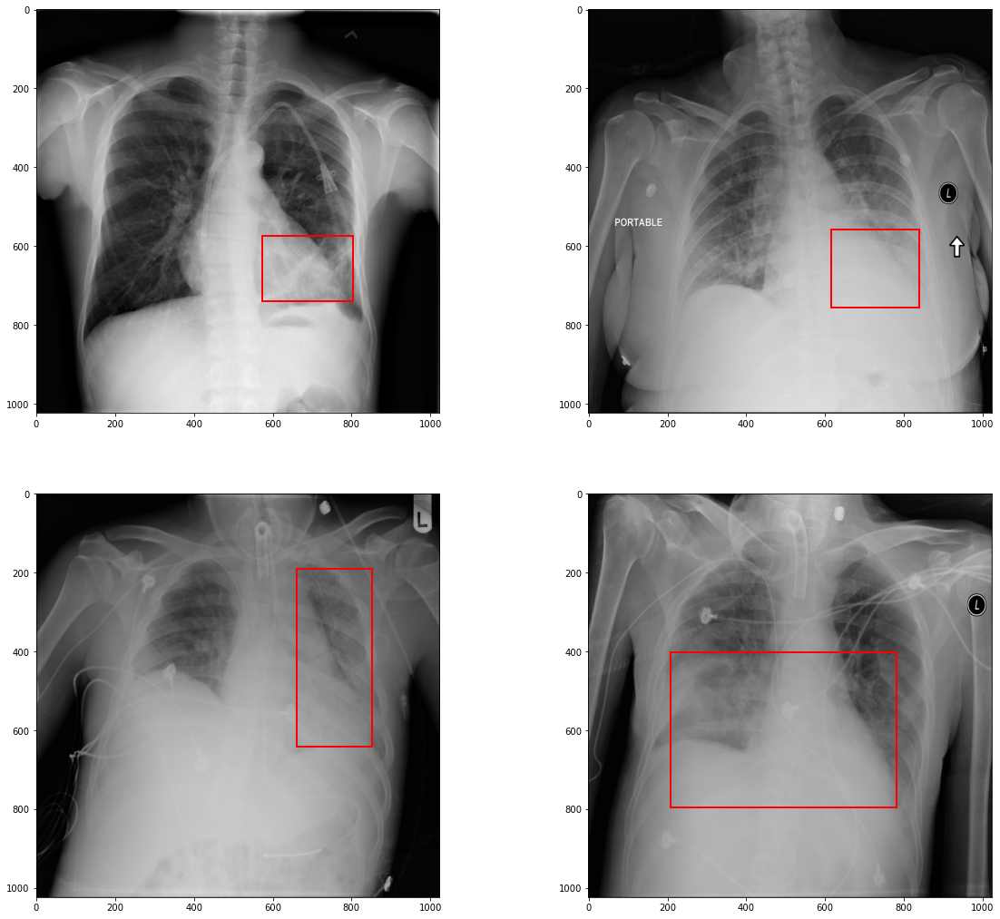

In [41]:
# draw figures with bounding box
CXR8_dir =  "/home/zhou/Documents/github/XAI/datasets/CXR8/"
box_file = "BBox_List_2017.csv"
box_df = pd.read_csv(os.path.join(CXR8_dir, box_file))
pneumonia_filter = box_df['Finding Label']=="Pneumonia"

pneumonia_box_df = box_df.loc[pneumonia_filter]
pneumonia_box_df.head(5)
sample_images_with_box = list(pneumonia_box_df.iloc[0:4,0])
print(sample_images_with_box)
print(os.path.join(CXR8_dir, "images", "images"))
def draw_bounding_box(file_path, fig, box):
    """draw bounding box in a figure"""

from matplotlib.patches import Rectangle

fig = plt.figure(figsize=(20, 18))
for idx in range(4):#show 4 sample chest xray
    fileName= sample_images_with_box[idx]
    file_path= os.path.join(CXR8_dir, "images", "images", fileName)
    ax = fig.add_subplot(2, 2, idx+1)
    chest_xray = cv2.imread(file_path)
    x = pneumonia_box_df.iloc[idx,2]
    y = pneumonia_box_df.iloc[idx,3]
    w = pneumonia_box_df.iloc[idx,4]
    h = pneumonia_box_df.iloc[idx,5]
    # Create a Rectangle patch
    print(f"(x,y)={x,y}, w={w}, h={h}")
    rect = Rectangle((x,y),w,h,linewidth=2,edgecolor='r',facecolor='none')
    plt.imshow(chest_xray)
    ax.add_patch(rect) # Add the patch to the Axes
plt.show()

In [42]:
import glob # retrieve paths of data inside sub folders easily
from torch.utils.data import Dataset, DataLoader

# define chest x-ray dataset
class ChestXray(Dataset):
    def __init__(self, data_root, transform=None, target_transform=None):
        self.data_root = data_root
        self.imgs, self.labels = self.read_images()
        self.transform = transform
        self.target_transform = target_transform
    def __len__(self):
        """ return the length of the dataset """
        return len(self.image_labels)
    def __getitem__(self, idx):
        """ return an item at idx: dataset[idx] """
        img_path = os.path.join(self.data_root, )
    def read_images(self):
        """ read data from data_root """
        sub_dirs = os.listdir(self.data_root)
        for sub_dir in sub_dirs:
            dest_path = os.path.join(train_dir, sub_dir)
            file_paths = glob.glob(dest_path+"/*", recursive=True)
            print(file_paths)
        return file_paths, None

train_dir = "/home/zhou/Documents/github/XAI/datasets/chest_xray/train/"
val_dir = "/home/zhou/Documents/github/XAI/datasets/chest_xray/val/"
test_dir = "/home/zhou/Documents/github/XAI/datasets/chest_xray/test/"
train_dataset = ChestXray(train_dir)
val_dataset = ChestXray(val_dir)
test_dataset = ChestXray(test_dir)

from torchvision import datasets, models, transforms

DATA_ROOT= "/home/zhou/Documents/github/XAI/datasets/chest_xray/"

['/home/zhou/Documents/github/XAI/datasets/chest_xray/train/PNEUMONIA/person756_bacteria_2660.jpeg', '/home/zhou/Documents/github/XAI/datasets/chest_xray/train/PNEUMONIA/person383_bacteria_1751.jpeg', '/home/zhou/Documents/github/XAI/datasets/chest_xray/train/PNEUMONIA/person326_bacteria_1506.jpeg', '/home/zhou/Documents/github/XAI/datasets/chest_xray/train/PNEUMONIA/person124_virus_234.jpeg', '/home/zhou/Documents/github/XAI/datasets/chest_xray/train/PNEUMONIA/person798_virus_1430.jpeg', '/home/zhou/Documents/github/XAI/datasets/chest_xray/train/PNEUMONIA/person1376_bacteria_3511.jpeg', '/home/zhou/Documents/github/XAI/datasets/chest_xray/train/PNEUMONIA/person1320_virus_2277.jpeg', '/home/zhou/Documents/github/XAI/datasets/chest_xray/train/PNEUMONIA/person1507_bacteria_3935.jpeg', '/home/zhou/Documents/github/XAI/datasets/chest_xray/train/PNEUMONIA/person487_bacteria_2058.jpeg', '/home/zhou/Documents/github/XAI/datasets/chest_xray/train/PNEUMONIA/person393_virus_784.jpeg', '/home/zho

In [43]:
data_dir = "/home/zhou/Documents/github/XAI/datasets/chest_xray"
CHECK_POINT_PATH = 'checkpoint.tar'
SUBMISSION_FILE = 'submission.csv'

# data augmentation and normalization for training
train_transforms= {'train': transforms.Compose([
    transforms.RandomRotation(5),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.RandomResizedCrop(224, scale=(0.96, 1.0), ratio=(0.95, 1.05)),
    transforms.Normalize([0.485], [0.229])    ])
    }
val_transforms = {"val":transforms.Compose([
    transforms.Resize([224, 224]),
    transforms.ToTensor(),
    transforms.Normalize([0.485], [0.229])])
    }
data_transforms = {**train_transforms, **val_transforms}
# ImageFolder return obj attributes:
# classes: List of the class names sorted alphabetically.
# class_to_idx: {class_name:class_index}, imgs:[(image path, class_index)]
image_datasets = {x:datasets.ImageFolder(os.path.join(data_dir, x),data_transforms[x])
                  for x in ['train', 'val']}
dataset_sizes = {x:len(image_datasets[x]) for x in ['train', 'val']}
dataloaders = {x:torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=4) for x in ['train', 'val']}
class_names = image_datasets['train'].classes
class_to_idx = image_datasets['train'].class_to_idx
image_sample_1 = image_datasets['train'][0][0]
print(f'classes:{class_names}')
print(f'class_to_idx:{class_to_idx}')
print(f'train size: {dataset_sizes["train"]}, val size: {dataset_sizes["val"]}')
print(f'sample image size: {image_sample_1[0].shape}')

classes:['NORMAL', 'PNEUMONIA']
class_to_idx:{'NORMAL': 0, 'PNEUMONIA': 1}
train size: 5216, val size: 16
sample image size: torch.Size([224, 224])


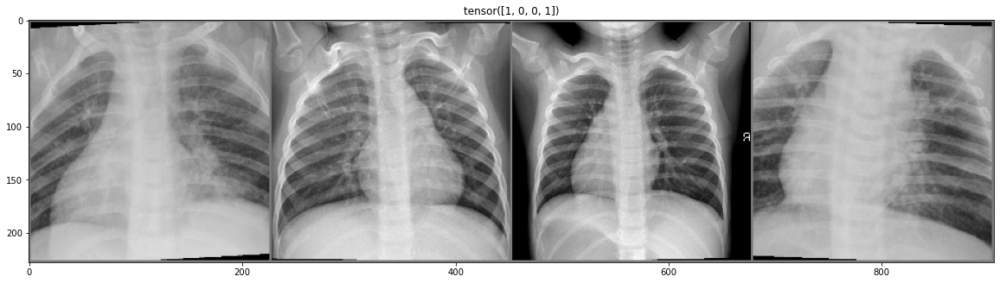

In [44]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose([1,2,0]) # (w, h, c), grayscale image: no need to transpose
    mean = np.array([0.485])
    std = np.array([0.229])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    fig = plt.figure(figsize=(20, 8))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated
# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))
# Make a grid from batch
sample_train_images = torchvision.utils.make_grid(inputs)
imshow(sample_train_images, title=classes)

In [45]:
model_conv = torchvision.models.resnet50(pretrained=True)

def train_model(model, criterion, optimizer, scheduler, num_epochs=2, checkpoint=None):
    """train model with specifications"""
    start_time = time.time()
    if checkpoint is None:
        best_model_wts = copy.deepcopy(model.state_dict())
        best_loss = math.inf 
        best_acc = 0.0
    else:
        print(f'val loss:{checkpoint["best_val_loss"]}, val acc:{checkpoint["best_val_accuracy"]}')
        model.load_state_dict(checkpoint['model_state_dict'])
        best_model_wts = copy.deepcopy(model.state_dict())
        optimizer.load_state_dict(checkpoint["optimizer_sate_dict"])
        scheduler.load_state_dict(checkpoint["scheduler_state_dict"])
        best_loss = checkpoint["best_val_loss"]
        best_acc = checkpoint["best_val_accuracy"]

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs-1}')
        print('-' * 10)
        # Each epoch has a training and val phase
        for phase in ['train', 'val']:
            if phase == "train":
                scheduler.step()
                model.train() # set model to training mode
            else:
                model.eval() # set model to val model
            running_loss = 0.0
            running_corrects = 0
            # iterate over data
            for i, (inputs, labels) in enumerate(dataloaders["phase"]):
                inputs = inputs.to(device)
                labels = labels.to(device)
                # zero the param gradients
                optimizer.zero_grad()
                if i % 200 == 199:
                    print(f'[{epoch + 1}, {i}, {running_loss/(i * inputs.size(0))}')
                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase=='train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)
                    # backward + optimize only if in the training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                # stats
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds==labels.data)
            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double()/dataset_sizes[phase]
            print(f'{phase}, Loss:{epoch_loss}, {epoch_acc}')
            # deep copy the model
            if phase == "val" and epoch_loss < best_loss:
                print(f'New best model found')
                print(f'Best loss:{epoch_loss}, prev best loss:{best_loss}')
                best_loss = epoch_loss
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                print()
    time_elapsed = time.time()-start_time
    print(f'Training complete in: {time_elapsed//60} mins {time_elapsed % 60}')
    print(f"Best val acc:{best_acc}, best val loss:{best_loss}")

    # load the best model weights
    model.load_state_dict(best_model_wts)
    return model, best_loss, best_acc



## load the pretrained model

In [46]:
import os
print(os.getcwd())

/home/zhou/Documents/github/XAI


In [47]:
class PneumoniaModelBase(nn.Module):

    # this is for loading the batch of train image and outputting its loss, accuracy
    # & predictions
    def training_step(self, batch, weight):
        images,labels = batch
        out = self(images)                                      # generate predictions
        loss = F.cross_entropy(out, labels, weight=weight)      # weighted compute loss
        acc,preds = accuracy(out, labels)                       # calculate accuracy

        return {'train_loss': loss, 'train_acc':acc}

    # this is for computing the train average loss and acc for each epoch
    def train_epoch_end(self, outputs):
        batch_losses = [x['train_loss'] for x in outputs]       # get all the batches loss
        epoch_loss = torch.stack(batch_losses).mean()           # combine losses
        batch_accs = [x['train_acc'] for x in outputs]          # get all the batches acc
        epoch_acc = torch.stack(batch_accs).mean()              # combine accuracies

        return {'train_loss': epoch_loss.item(), 'train_acc': epoch_acc.item()}

    # this is for loading the batch of val/test image and outputting its loss, accuracy,
    # predictions & labels
    def validation_step(self, batch):
        images,labels = batch
        out = self(images)                                      # generate predictions
        loss = F.cross_entropy(out, labels)                     # compute loss
        acc,preds = accuracy(out, labels)                       # calculate acc & get preds

        return {'val_loss': loss.detach(), 'val_acc':acc.detach(),
                'preds':preds.detach(), 'labels':labels.detach()}
    # detach extracts only the needed number, or other numbers will crowd memory

    # this is for computing the validation average loss and acc for each epoch
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]         # get all the batches loss
        epoch_loss = torch.stack(batch_losses).mean()           # combine losses
        batch_accs = [x['val_acc'] for x in outputs]            # get all the batches acc
        epoch_acc = torch.stack(batch_accs).mean()              # combine accuracies

        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    # this is for printing out the results after each epoch
    def epoch_end(self, epoch, train_result, val_result):
        print('Epoch [{}], train_loss: {:.4f}, train_acc: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}'.
              format(epoch+1, train_result['train_loss'], train_result['train_acc'],
                     val_result['val_loss'], val_result['val_acc']))

    # this is for using on the test set, it outputs the average loss and acc,
    # and outputs the predictions
    def test_prediction(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()           # combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()              # combine accuracies
        # combine predictions
        batch_preds = [pred for x in outputs for pred in x['preds'].tolist()]
        # combine labels
        batch_labels = [lab for x in outputs for lab in x['labels'].tolist()]

        return {'test_loss': epoch_loss.item(), 'test_acc': epoch_acc.item(),
                'test_preds': batch_preds, 'test_labels': batch_labels}

In [48]:
class PneumoniaModelBase(nn.Module):

    # this is for loading the batch of train image and outputting its loss, accuracy
    # & predictions
    def training_step(self, batch, weight):
        images,labels = batch
        out = self(images)                                      # generate predictions
        loss = F.cross_entropy(out, labels, weight=weight)      # weighted compute loss
        acc,preds = accuracy(out, labels)                       # calculate accuracy

        return {'train_loss': loss, 'train_acc':acc}

    # this is for computing the train average loss and acc for each epoch
    def train_epoch_end(self, outputs):
        batch_losses = [x['train_loss'] for x in outputs]       # get all the batches loss
        epoch_loss = torch.stack(batch_losses).mean()           # combine losses
        batch_accs = [x['train_acc'] for x in outputs]          # get all the batches acc
        epoch_acc = torch.stack(batch_accs).mean()              # combine accuracies

        return {'train_loss': epoch_loss.item(), 'train_acc': epoch_acc.item()}

    # this is for loading the batch of val/test image and outputting its loss, accuracy,
    # predictions & labels
    def validation_step(self, batch):
        images,labels = batch
        out = self(images)                                      # generate predictions
        loss = F.cross_entropy(out, labels)                     # compute loss
        acc,preds = accuracy(out, labels)                       # calculate acc & get preds

        return {'val_loss': loss.detach(), 'val_acc':acc.detach(),
                'preds':preds.detach(), 'labels':labels.detach()}
    # detach extracts only the needed number, or other numbers will crowd memory

    # this is for computing the validation average loss and acc for each epoch
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]         # get all the batches loss
        epoch_loss = torch.stack(batch_losses).mean()           # combine losses
        batch_accs = [x['val_acc'] for x in outputs]            # get all the batches acc
        epoch_acc = torch.stack(batch_accs).mean()              # combine accuracies

        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    # this is for printing out the results after each epoch
    def epoch_end(self, epoch, train_result, val_result):
        print('Epoch [{}], train_loss: {:.4f}, train_acc: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}'.
              format(epoch+1, train_result['train_loss'], train_result['train_acc'],
                     val_result['val_loss'], val_result['val_acc']))

    # this is for using on the test set, it outputs the average loss and acc,
    # and outputs the predictions
    def test_prediction(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()           # combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()              # combine accuracies
        # combine predictions
        batch_preds = [pred for x in outputs for pred in x['preds'].tolist()]
        # combine labels
        batch_labels = [lab for x in outputs for lab in x['labels'].tolist()]

        return {'test_loss': epoch_loss.item(), 'test_acc': epoch_acc.item(),
                'test_preds': batch_preds, 'test_labels': batch_labels}

class PneumoniaResnet(PneumoniaModelBase):
    def __init__(self):
        super().__init__()
        # Use a pretrained model
        self.network = models.resnet50(pretrained=True)
        # Freeze training for all layers before classifier
        for param in self.network.fc.parameters():
            param.require_grad = False
        num_features = self.network.fc.in_features # get number of in features of last layer
        self.network.fc = nn.Linear(num_features, 2) # replace model classifier

    def forward(self, xb):
        return self.network(xb)

#     def freeze(self):
#         # To freeze the residual layers
#         for param in self.network.parameters():
#             param.require_grad = False
#         for param in self.network.fc.parameters():
#             param.require_grad = True

#     def unfreeze(self):
#         # Unfreeze all layers
#         for param in self.network.parameters():
#             param.require_grad = True

# this is for loading the model from a previously saved one
def load_checkpoint(filepath):
    checkpoint = torch.load(filepath)
    model = checkpoint['model']
    model.load_state_dict(checkpoint['state_dict'])
    for parameter in model.parameters():
        parameter.requires_grad = False

    model.eval()
    return model
file_path = os.path.join('/home/zhou/Documents/github/XAI', 'PneumoniaResnet.pth')
resnet_model = load_checkpoint(file_path)
resnet_model

PneumoniaResnet(
  (network): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
  

In [49]:
idx = 0
fileName= sample_images_with_box[idx]
sample_file_path= os.path.join(CXR8_dir, "images", "images", fileName)
chest_xray = cv2.imread(sample_file_path)
print(f'chest xray shape: {chest_xray.shape}')
chest_xray_tensor = torch.tensor(chest_xray)
print(f'chest xray tensor shape: {chest_xray_tensor.shape}')

chest xray shape: (1024, 1024, 3)
chest xray tensor shape: torch.Size([1024, 1024, 3])


In [50]:
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device) # yield will stop here, perform other steps, and the resumes to the next loop/batch

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

@torch.no_grad()
def test_predict(model, test_loader):
    model.eval()
    # perform testing for each batch
    outputs = [model.validation_step(batch) for batch in test_loader]
    results = model.test_prediction(outputs)
    print('test_loss: {:.4f}, test_acc: {:.4f}'
          .format(results['test_loss'], results['test_acc']))

    return results['test_preds'], results['test_labels']

TypeError: 'AxesSubplot' object is not subscriptable

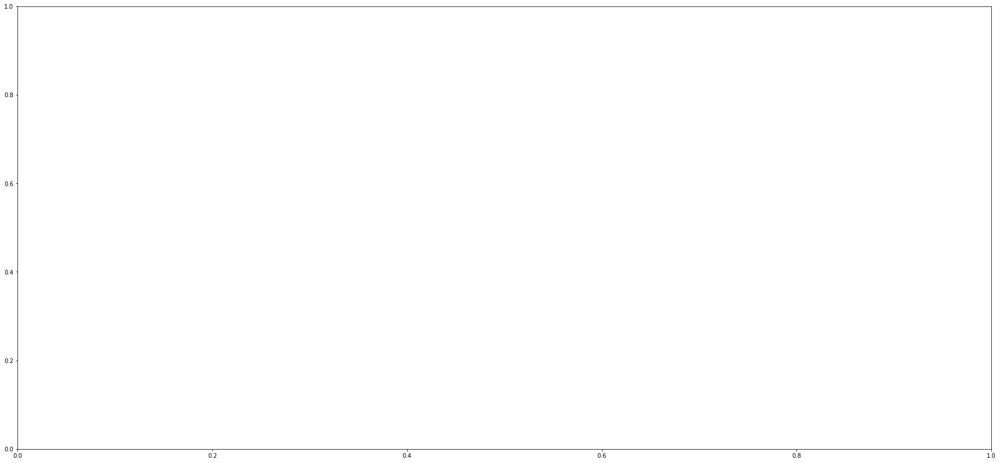

In [51]:
test_dataset = ImageFolder(data_dir+'/test',
                           transform=tt.Compose([tt.Resize(255),
                                                 tt.CenterCrop(224),
                                                 tt.ToTensor()
                                                 #tt.Normalize(mean=[0.485, 0.456, 0.406],
                                                 #             std=[0.229, 0.224, 0.225],
                                                 #             inplace=True)
                                                 ]))

# select 5 normal and 5 pneumonia images indices
idxs = torch.tensor(np.append(np.arange(start=0, stop=1, step=1),
                              np.arange(start=500, stop=501, step=1)))

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(30,14))

for c,i in enumerate(idxs):
    img_tensor, label = test_dataset[i]
    ax[c//5][c%5].imshow(img_tensor[0,:,:], cmap='gray')
    ax[c//5][c%5].set_title('Label: {}\nPrediction: {}'
                            .format(test_dataset.classes[label],
                                    test_dataset.classes[preds[i]]),
                            fontsize=25)
    ax[c//5][c%5].axis('off')
plt.savefig("prediction_samples.pdf")


In [54]:
# img_tensor, label = test_dataset[0]
# img_label = test_dataset.classes[label]
# preds = resnet_model(chest_xray_tensor.unsqueeze(0))
# Evaluate test set
test_dl = DataLoader(test_dataset, batch_size=1)
test_dl = DeviceDataLoader(test_dl, device)
preds,labels = test_predict(resnet_model, test_dl)

NameError: name 'to_device' is not defined

In [ ]:
from LEG.methods.LEGv0 import *

preds = VGG19_MODEL.predict(image_input)
for pred_class in decode_predictions(preds)[0]:
    print(pred_class)
chosen_class = np.argmax(preds)
print("The Classfication Category is ", chosen_class)

begin_time = time()
LEG = LEG_explainer(np.expand_dims(img.copy(), axis = 0), VGG19_MODEL, predict_vgg19, num_sample = 10000, penalty=None)
LEGTV = LEG_explainer(np.expand_dims(img.copy(), axis = 0), VGG19_MODEL, predict_vgg19, num_sample = 10000, penalty='TV', lambda_arr = [0.1, 0.3])
end_time = time()
plt.imshow(LEG[0][0], cmap='hot', interpolation="nearest")
plt.show() #change the backend of matplotlib if it can not be displayed
plt.imshow(LEGTV[0][0], cmap='hot', interpolation="nearest")
plt.show()

print("The time spent on LEG explanation is ",round((end_time - begin_time)/60,2), "mins")


![title]("/home/zhou/Documents/github/XAI/LEG/Image/iou_formula.png")

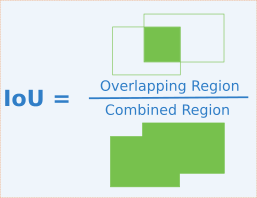

In [63]:
from IPython.display import Image
from IPython.core.display import HTML
Image("/home/zhou/Documents/github/XAI/LEG/Image/iou_formula.png")

In [3]:
def get_iou(a, b, epsilon=1e-5):
    """ Given two boxes `a` and `b` defined as a list of four numbers:
            [x1,y1,x2,y2]
        where:
            x1,y1 represent the upper left corner
            x2,y2 represent the lower right corner
        It returns the Intersect of Union score for these two boxes.

    Args:
        a:          (list of 4 numbers) [x1,y1,x2,y2]
        b:          (list of 4 numbers) [x1,y1,x2,y2]
        epsilon:    (float) Small value to prevent division by zero

    Returns:
        (float) The Intersect of Union score.
    """
    # COORDINATES OF THE INTERSECTION BOX
    x1 = max(a[0], b[0])
    y1 = max(a[1], b[1])
    x2 = min(a[2], b[2])
    y2 = min(a[3], b[3])

    # AREA OF OVERLAP - Area where the boxes intersect
    width = (x2 - x1)
    height = (y2 - y1)
    # handle case where there is NO overlap
    if (width<0) or (height <0):
        return 0.0
    area_overlap = width * height

    # COMBINED AREA
    area_a = (a[2] - a[0]) * (a[3] - a[1])
    area_b = (b[2] - b[0]) * (b[3] - b[1])
    area_combined = area_a + area_b - area_overlap

    # RATIO OF AREA OF OVERLAP OVER COMBINED AREA
    iou = area_overlap / (area_combined+epsilon)
    return iou

In [18]:
imageName = '/home/zhou/Documents/github/XAI/LEG/Image/person1_bacteria_1.jpeg'

In [ ]:
import cv2
import numpy as np

# read image
img = cv2.imread(imageName)

# convert to grayscale
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

# threshold
thresh = cv2.threshold(gray,128,255,cv2.THRESH_BINARY)[1]

# get contours
result = img.copy()
contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = contours[0] if len(contours) == 2 else contours[1]
for cntr in contours:
    x,y,w,h = cv2.boundingRect(cntr)
    cv2.rectangle(result, (x, y), (x+w, y+h), (0, 0, 255), 2)
    print("x,y,w,h:",x,y,w,h)

# save resulting image
cv2.imwrite('two_blobs_result.jpg',result)

# show thresh and result
cv2.imshow("bounding_box", result)
cv2.waitKey(0)
cv2.destroyAllWindows()

x,y,w,h: 29 433 1 1
x,y,w,h: 673 432 1 7
x,y,w,h: 675 429 1 3
x,y,w,h: 29 428 1 1
x,y,w,h: 29 425 1 1
x,y,w,h: 43 420 2 6
x,y,w,h: 42 414 1 2
x,y,w,h: 45 401 1 3
x,y,w,h: 45 399 1 1
x,y,w,h: 29 389 6 34
x,y,w,h: 644 311 1 1
x,y,w,h: 639 303 5 7
x,y,w,h: 597 295 1 1
x,y,w,h: 620 294 1 2
x,y,w,h: 560 278 3 2
x,y,w,h: 599 267 1 1
x,y,w,h: 589 259 4 3
x,y,w,h: 592 253 1 1
x,y,w,h: 603 250 1 1
x,y,w,h: 574 247 2 1
x,y,w,h: 580 246 7 13
x,y,w,h: 584 209 4 3
x,y,w,h: 594 208 2 1
x,y,w,h: 587 207 1 1
x,y,w,h: 579 207 3 2
x,y,w,h: 605 200 2 1
x,y,w,h: 584 199 1 1
x,y,w,h: 565 199 13 7
x,y,w,h: 591 197 1 1
x,y,w,h: 578 196 1 1
x,y,w,h: 560 196 4 2
x,y,w,h: 647 194 2 3
x,y,w,h: 536 159 1 1
x,y,w,h: 644 157 1 2
x,y,w,h: 73 156 1 2
x,y,w,h: 641 148 1 1
x,y,w,h: 567 143 1 1
x,y,w,h: 562 141 1 1
x,y,w,h: 560 140 1 1
x,y,w,h: 549 139 10 8
x,y,w,h: 529 134 1 1
x,y,w,h: 526 133 2 1
x,y,w,h: 549 126 3 1
x,y,w,h: 519 120 1 1
x,y,w,h: 588 100 2 2
x,y,w,h: 588 96 2 1
x,y,w,h: 533 92 2 1
x,y,w,h: 528 89 2 1


In [4]:
def batch_iou(a, b, epsilon=1e-5):
    """ Given two arrays `a` and `b` where each row contains a bounding
        box defined as a list of four numbers:
            [x1,y1,x2,y2]
        where:
            x1,y1 represent the upper left corner
            x2,y2 represent the lower right corner
        It returns the Intersect of Union scores for each corresponding
        pair of boxes.

    Args:
        a:          (numpy array) each row containing [x1,y1,x2,y2] coordinates
        b:          (numpy array) each row containing [x1,y1,x2,y2] coordinates
        epsilon:    (float) Small value to prevent division by zero

    Returns:
        (numpy array) The Intersect of Union scores for each pair of bounding
        boxes.
    """
    # COORDINATES OF THE INTERSECTION BOXES
    x1 = np.array([a[:, 0], b[:, 0]]).max(axis=0)
    y1 = np.array([a[:, 1], b[:, 1]]).max(axis=0)
    x2 = np.array([a[:, 2], b[:, 2]]).min(axis=0)
    y2 = np.array([a[:, 3], b[:, 3]]).min(axis=0)

    # AREAS OF OVERLAP - Area where the boxes intersect
    width = (x2 - x1)
    height = (y2 - y1)

    # handle case where there is NO overlap
    width[width < 0] = 0
    height[height < 0] = 0

    area_overlap = width * height

    # COMBINED AREAS
    area_a = (a[:, 2] - a[:, 0]) * (a[:, 3] - a[:, 1])
    area_b = (b[:, 2] - b[:, 0]) * (b[:, 3] - b[:, 1])
    area_combined = area_a + area_b - area_overlap

    # RATIO OF AREA OF OVERLAP OVER COMBINED AREA
    iou = area_overlap / (area_combined + epsilon)
    return iou